In [13]:
!pip install fsspec
!pip install s3fs

     |████████████████████████████████| 51kB 4.8MB/s 
     |████████████████████████████████| 1.3MB 9.0MB/s 
     |████████████████████████████████| 6.5MB 35.5MB/s 
     |████████████████████████████████| 143kB 56.8MB/s 
     |████████████████████████████████| 296kB 55.5MB/s 
     |████████████████████████████████| 552kB 44.4MB/s 
  Created wheel for idna-ssl: filename=idna_ssl-1.1.0-cp36-none-any.whl size=3162 sha256=ffd512defbfb355eab56158c334ea4302e2cc42d3c46b129838703cad6398455
  Stored in directory: /root/.cache/pip/wheels/d3/00/b3/32d613e19e08a739751dd6bf998cfed277728f8b2127ad4eb7
Successfully built idna-ssl
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: docutils 0.16
    Uninstalling docutils-0.16:
      Successfully uninstalled docutils-0.16


In [8]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np
from fastprogress import progress_bar as pb

In [9]:
import warnings
warnings.simplefilter('ignore')

In [11]:
FILEPATH_FMT = 's3://fin-app/stockprice_concat/{code}.csv'

In [14]:
df_stocklist = pd.read_csv('s3://fin-app/stocklist/stocklist.csv')

In [15]:
df_stocklist.head()

,銘柄コード,銘柄名,市場名,業種分類,単元株数,日経225採用銘柄
0,1301,(株)極洋,東証1部,水産・農林業,100,NaN
1,1332,日本水産(株),東証1部,水産・農林業,100,1.0
2,1333,マルハニチロ(株),東証1部,水産・農林業,100,1.0
3,1352,(株)ホウスイ,東証1部,卸売業,100,NaN
4,1376,カネコ種苗(株),東証1部,水産・農林業,100,NaN


In [16]:
codes = df_stocklist['銘柄コード'].unique()

In [17]:
codes

array([1301, 1332, 1333, ..., 9995, 9996, 9997])

In [18]:
df_dict = {}
skipped_code = []

for code in pb(codes):
    try:
        df_dict[code] = pd.read_csv(FILEPATH_FMT.format(code=code))
    except Exception:
        skipped_code.append(code)

In [19]:
skipped_code

[3229, 4881, 8962, 8965, 8969, 8970, 8974, 8978, 8980, 8983]

In [20]:
valid_codes = list(df_dict.keys())

In [21]:
df_dict[codes[0]].head()

,日付,始値,高値,安値,終値,出来高,終値調整値,last_close,stop_high_low
0,1983-01-04,144,144,140,141,309000,1410,NaN,0
1,1983-01-05,144,155,142,153,2416000,1530,141.0,0
2,1983-01-06,162,168,157,160,7245000,1600,153.0,0
3,1983-01-07,160,162,155,155,1532000,1550,160.0,0
4,1983-01-08,157,158,152,152,340000,1520,155.0,0


In [22]:
for code, df in df_dict.items():
    df_dict[code] = df[['日付', '終値']]

In [23]:
 for code, df in df_dict.items():
    df_dict[code]['日付'] = pd.to_datetime(df_dict[code]['日付'])

In [24]:
df_dict[codes[0]].head()

,日付,終値
0,1983-01-04,141
1,1983-01-05,153
2,1983-01-06,160
3,1983-01-07,155
4,1983-01-08,152


In [35]:
df_merged = None

for code, df in pb(df_dict.items()):
    # print(code)
    # print(df)
    if df_merged is None:
        df_merged = df.rename(columns={'終値': code})
    else:
        df_merged = pd.merge(df_merged, df.rename(columns={'終値': code}), how='outer', on='日付')

In [36]:
df_merged.head()

,日付,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
0,1983-01-04,141.0,266.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,328.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1983-01-05,153.0,267.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,329.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1983-01-06,160.0,270.0,NaN,215.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,318.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1983-01-07,155.0,270.0,NaN,220.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,338.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1983-01-08,152.0,268.0,NaN,218.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,343.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
df_merged.tail()

,日付,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
9431,2020-07-21,2773.0,473.0,2167.0,916.0,1460.0,3270.0,2095.0,919.0,2525.0,897.0,2075.0,638.0,192.0,635.0,2306.0,NaN,4860.0,1614.0,250.0,1186.0,610.0,634.0,619.0,NaN,1002.0,434.0,171.0,761.0,NaN,932.0,287.0,550.0,590.0,364.0,426.0,3775.0,583.0,20.0,125.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9432,2020-07-22,2720.0,463.0,2138.0,905.0,1413.0,3275.0,2068.0,906.0,2520.0,881.0,2070.0,635.0,192.0,620.0,2270.0,NaN,4735.0,1602.0,243.0,1177.0,607.0,630.0,611.0,NaN,987.0,429.0,168.0,754.0,NaN,933.0,289.0,557.0,608.0,359.0,429.0,3640.0,583.0,19.0,124.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9433,1984-09-01,NaN,322.0,NaN,280.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,403.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9434,1984-10-26,NaN,317.0,NaN,258.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,426.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9435,1987-10-22,NaN,595.0,NaN,1590.0,1650.0,7180.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,566.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
df_merged['日付'] = pd.to_datetime(df_merged['日付'])

In [39]:
df_merged = df_merged.set_index('日付')

In [40]:
df_merged.sort_index(inplace=True)

In [41]:
df_merged

,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,1515,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
日付,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1983-01-04,141.0,266.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,328.0,NaN,384.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-05,153.0,267.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,329.0,NaN,375.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-06,160.0,270.0,NaN,215.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,318.0,NaN,373.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-07,155.0,270.0,NaN,220.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,338.0,NaN,385.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-08,152.0,268.0,NaN,218.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,343.0,NaN,393.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-15,2748.0,474.0,2155.0,925.0,1466.0,3135.0,2041.0,912.0,2551.0,905.0,2073.0,633.0,200.0,650.0,2044.0,NaN,4825.0,1601.0,277.0,1145.0,619.0,620.0,579.0,NaN,1014.0,433.0,180.0,713.0,1400.0,971.0,297.0,525.0,623.0,366.0,433.0,3600.0,595.0,20.0,124.0,4235.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-16,2739.0,477.0,2173.0,925.0,1443.0,3215.0,2088.0,915.0,NaN,909.0,2055.0,625.0,192.0,650.0,2255.0,NaN,4760.0,1592.0,276.0,1150.0,610.0,617.0,588.0,NaN,1003.0,434.0,175.0,721.0,1450.0,960.0,292.0,521.0,614.0,364.0,437.0,3650.0,591.0,20.0,123.0,4295.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-17,2756.0,471.0,2158.0,920.0,1433.0,3220.0,2076.0,909.0,2538.0,904.0,2049.0,634.0,190.0,653.0,2308.0,NaN,4710.0,1589.0,270.0,1173.0,613.0,626.0,615.0,NaN,999.0,440.0,171.0,720.0,1450.0,954.0,289.0,621.0,580.0,361.0,439.0,3680.0,587.0,20.0,125.0,4260.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [127]:
start_dt = '2014-01-01'

In [42]:
df_corr = df_merged[df_merged.index > start_dt].corr()

In [43]:
df_corr

,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,1515,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
1301,1.000000,0.707965,0.829205,0.768655,0.845203,0.894462,-0.381475,0.713516,0.746346,-0.474499,0.608895,0.289469,-0.179210,-0.306344,0.010216,0.884730,0.596132,0.691940,0.347326,0.604947,0.622603,-0.470916,-0.476693,0.474160,-0.660216,0.124837,-0.488012,0.141940,0.252375,0.495980,0.009196,0.711236,0.177917,0.695539,-0.012618,-0.480527,0.785746,-0.340854,0.424190,0.973380,...,0.846468,0.474907,0.643707,0.830099,0.558350,0.557901,-0.096749,0.266174,0.249258,0.974200,0.201863,0.187348,-0.611782,0.922942,0.028912,0.752981,-0.419550,0.749656,-0.517951,0.555668,-0.556362,0.820643,0.626855,0.571890,0.097033,0.680093,0.558861,0.795980,0.380825,0.336228,0.700255,0.499957,-0.470984,-0.670892,-0.140589,0.464874,0.482194,0.154370,0.800030,0.778178
1332,0.707965,1.000000,0.809676,0.565990,0.669041,0.850914,-0.298518,0.709155,0.598565,-0.519359,0.351366,0.133388,-0.349625,-0.251550,-0.146174,0.486727,0.495345,0.553359,0.047710,0.391399,0.281577,-0.643106,-0.592051,0.264912,-0.502952,-0.013626,-0.143989,-0.012831,0.184931,-0.051134,-0.254363,0.472626,-0.183875,0.616037,0.548955,-0.533106,0.681958,-0.578676,0.059903,0.677297,...,0.752779,0.450270,0.660074,0.610029,0.577372,0.472191,-0.359686,0.236297,0.338813,0.754414,0.013637,0.424797,-0.730149,0.765846,-0.221842,0.639327,-0.484590,0.610304,-0.519314,0.124016,-0.708544,0.784091,0.623320,0.686769,0.140529,0.679094,0.265364,0.609967,0.388980,0.224451,0.480557,0.632265,-0.215413,-0.587281,-0.202890,0.436648,0.262249,-0.117525,0.757577,0.583093
1333,0.829205,0.809676,1.000000,0.656450,0.799233,0.866912,-0.357645,0.586395,0.687984,-0.566806,0.404661,0.252135,0.686415,-0.063254,-0.217366,0.782329,0.753668,0.590835,0.197587,0.417070,0.644965,-0.526610,-0.425625,0.166213,-0.524998,0.294500,-0.277551,0.171259,-0.011027,0.330599,-0.379338,0.657812,-0.062843,0.863899,0.525217,-0.486147,0.542747,-0.370900,0.238594,0.784708,...,0.734281,0.555570,0.626652,0.668768,0.732084,0.672523,-0.223392,0.350217,0.494508,0.833484,0.000181,0.362200,-0.548896,0.854883,-0.090169,0.595543,-0.333198,0.627397,-0.483258,0.464501,-0.416671,0.727892,0.418692,0.494176,0.185713,0.741099,0.418512,0.702806,0.275312,0.513949,0.564469,0.576749,-0.280362,-0.613536,-0.236426,0.526012,0.508182,-0.018935,0.764649,0.810708
1352,0.768655,0.565990,0.656450,1.000000,0.638145,0.743838,-0.351384,0.720456,0.687687,-0.364064,0.767209,0.208821,-0.111116,-0.496031,0.193672,-0.155471,0.639767,0.842836,0.145444,0.758578,0.718905,-0.327790,-0.318082,0.507431,-0.605813,0.089774,-0.554662,-0.289733,0.430983,-0.354671,0.105917,0.452859,0.640359,0.506268,0.058490,0.207479,0.291437,-0.526897,0.688815,0.683934,...,0.823531,0.417870,0.791767,0.725941,0.363304,0.453904,-0.409280,0.069081,0.171925,0.696382,0.542325,0.030461,-0.435003,0.860049,0.172667,0.782504,-0.585288,0.974499,-0.768963,0.661131,-0.513968,0.766993,0.694676,0.632548,-0.221576,0.479737,0.445759,0.961895,0.594660,0.222591,0.617416,0.651058,-0.557581,-0.569591,-0.125074,0.198342,0.745178,0.081730,0.891011,0.615467
1376,0.845203,0.669041,0.799233,0.638145,1.000000,0.862904,-0.180194,0.524632,0.798805,-0.474266,0.339355,0.441456,-0.282920,-0.105789,-0.237825,0.650048,0.601420,0.572308,0.387278,0.350208,0.494452,-0.638398,-0.301669,0.256015,-0.385477,0.343854,-0.248665,0.315323,0.139827,0.519224,0.259642,0.161563,0.516540,0.147758,0.008878,0.160977,-0.052971,-0.297452,0.320744,0.851884,...,0.744507,0.491180,0.442976,0.705138,0.677819,0.684114,-0.111904,0.426459,0.527841,0.822885,-0.021567,0.499046,-0.617991,0.804096,-0.013692,0.595691,-0.144993,0.578394,-0.273448,0.478902,-0.520224,0.834851,0.439

In [44]:
import seaborn as sns

In [45]:
df_corr = df_corr.fillna(0)

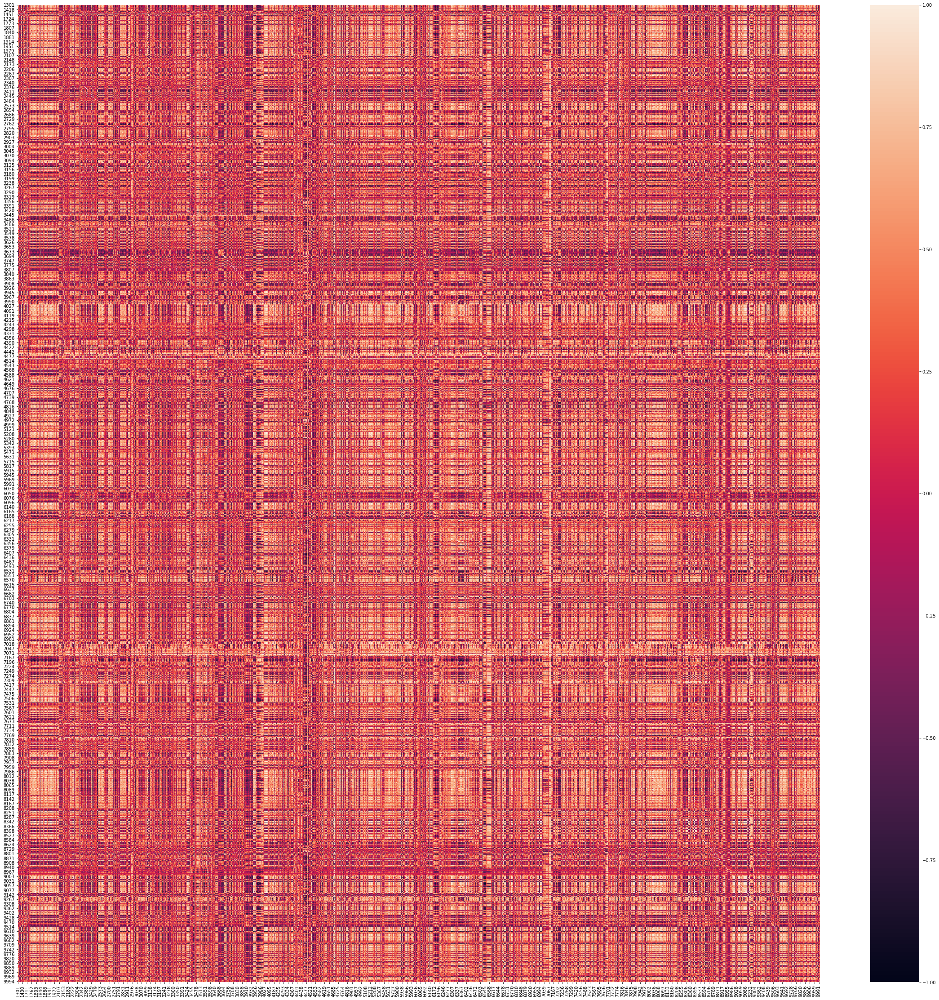

In [46]:
plt.figure(figsize=(40, 40))
sns.heatmap(df_corr)

In [49]:
corr = np.array(df_corr)

In [55]:
corr.shape

(3856, 3856)

In [56]:
import scipy

In [79]:
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster

In [68]:
dist = (1 - corr) / 2

for i in range(dist.shape[0]):
    dist[i, i] = 0

In [77]:
res1 = linkage(dist, method='average')

In [78]:
res1.shape

(3855, 4)

In [80]:
res1

array([[1.31000000e+02, 3.42800000e+03, 7.07106781e-01, 2.00000000e+00],
       [3.22300000e+03, 3.25600000e+03, 7.20298228e-01, 2.00000000e+00],
       [1.67000000e+03, 1.77600000e+03, 7.35837600e-01, 2.00000000e+00],
       ...,
       [7.69400000e+03, 7.70700000e+03, 1.77115284e+01, 2.44500000e+03],
       [7.70400000e+03, 7.70800000e+03, 2.13633892e+01, 3.85400000e+03],
       [7.57500000e+03, 7.70900000e+03, 2.31521917e+01, 3.85600000e+03]])

In [75]:
res2 = linkage(scipy.spatial.distance.squareform(dist), method='average')

In [74]:
res2.shape

(3855, 4)

In [81]:
res2

array([[2.26200000e+03, 2.55700000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.26600000e+03, 3.49300000e+03, 0.00000000e+00, 2.00000000e+00],
       [5.54000000e+02, 2.91800000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [1.31000000e+02, 3.42800000e+03, 5.00000000e-01, 2.00000000e+00],
       [7.70700000e+03, 7.70800000e+03, 5.00000000e-01, 1.41900000e+03],
       [7.69400000e+03, 7.70900000e+03, 5.28063887e-01, 3.85600000e+03]])

In [82]:
clusters = fcluster(res1, t=10, criterion='maxclust')

In [84]:
clusters.shape

(3856,)

In [96]:
df_cluster = pd.DataFrame(
    index=df_corr.index
)

n_clusters = [3, 6, 10, 15, 25, 50, 100]

for nc in pb(n_clusters):
    for i, res in enumerate([res1, res2]):
        clusters = fcluster(res, t=nc, criterion='maxclust')
        df_cluster[f'cluster_{nc}_res{i+1}'] = clusters
        print(df_cluster[f'cluster_{nc}_res{i+1}'].value_counts())

3    2445
2    1409
1       2
Name: cluster_3_res1, dtype: int64
1    2437
2    1419
Name: cluster_3_res2, dtype: int64
5    2205
2    1409
6     190
3      46
4       4
1       2
Name: cluster_6_res1, dtype: int64
1    2437
2    1259
3      84
4      74
5       1
6       1
Name: cluster_6_res2, dtype: int64
7     2205
2      730
4      579
9      167
3      100
5       46
8       22
6        4
1        2
10       1
Name: cluster_10_res1, dtype: int64
1     2437
3     1104
2       99
6       81
8       72
4       56
5        3
7        2
9        1
10       1
Name: cluster_10_res2, dtype: int64
9     1614
3      723
10     591
6      504
14     157
4      100
5       75
7       46
12      13
13      10
11       9
2        7
8        4
1        2
15       1
Name: cluster_15_res1, dtype: int64
1     2437
4     1045
3       90
10      81
13      66
5       58
8       51
2        9
12       6
7        5
9        3
11       2
15       1
14       1
6        1
Name: cluster_15_res2, dtype: in

In [97]:
df_cluster

,cluster_3_res1,cluster_3_res2,cluster_6_res1,cluster_6_res2,cluster_10_res1,cluster_10_res2,cluster_15_res1,cluster_15_res2,cluster_25_res1,cluster_25_res2,cluster_50_res1,cluster_50_res2,cluster_100_res1,cluster_100_res2
1301,3,1,5,1,7,1,9,1,15,2,25,4,54,7
1332,3,1,5,1,7,1,9,1,15,2,25,5,54,13
1333,3,1,5,1,7,1,9,1,15,2,25,4,54,7
1352,3,1,5,1,7,1,9,1,15,2,25,4,54,7
1376,3,1,5,1,7,1,9,1,15,2,25,4,54,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,3,1,5,1,7,1,10,1,17,2,30,5,61,12
9994,3,1,5,1,7,1,10,1,17,2,30,6,62,15
9995,2,2,2,2,4,3,6,4,10,11,18,27,43,57
9996,3,1,5,1,7,1,9,1,15,2,25,4,54,7


In [100]:
df_cluster = pd.merge(df_cluster, df_stocklist, left_index=True, right_on='銘柄コード')

In [141]:
df_cluster['cluster_50_res1'].value_counts().index[4:]

Int64Index([ 4, 31,  7,  3,  5, 27, 15, 19, 11, 41, 17,  6, 20,  9, 39, 13, 46,
            48, 12, 47,  8, 44, 22, 32, 16, 34,  2, 35, 38, 36, 42, 14, 28, 23,
            45, 21, 10, 40,  1, 29, 37, 49, 24, 33, 43, 50],
           dtype='int64')

41


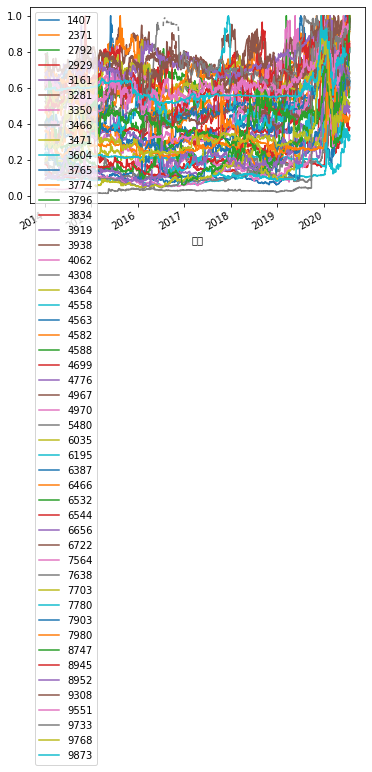

17


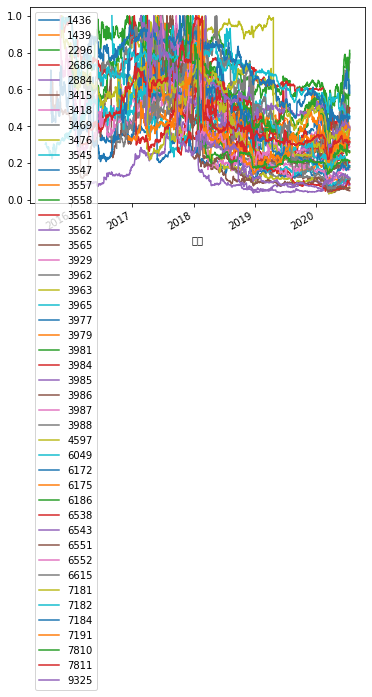

6


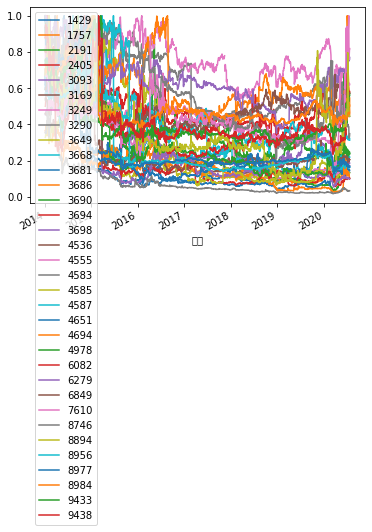

20


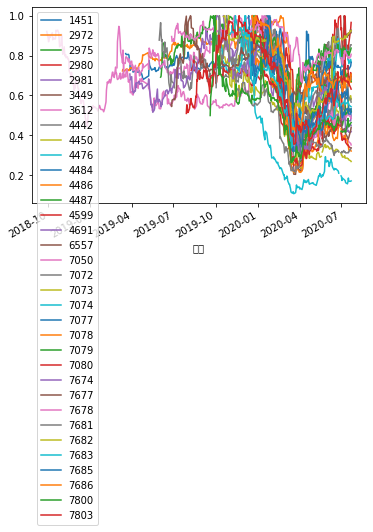

9


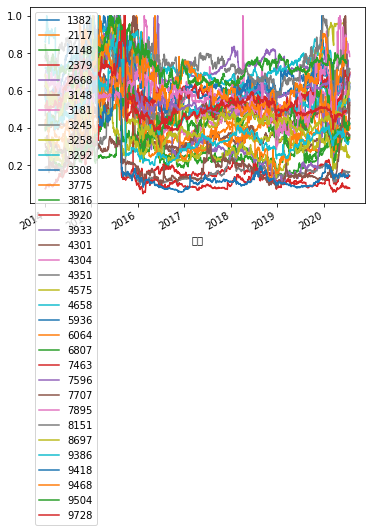

39


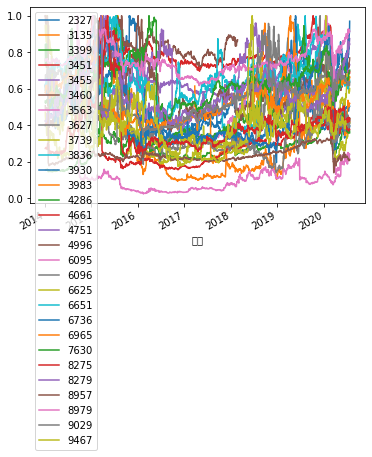

13


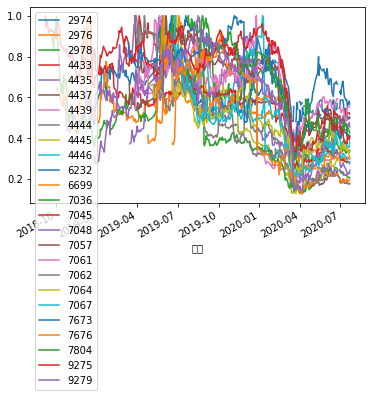

46


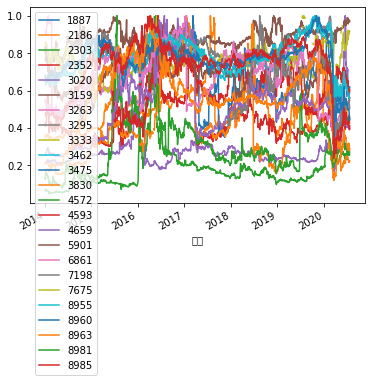

48


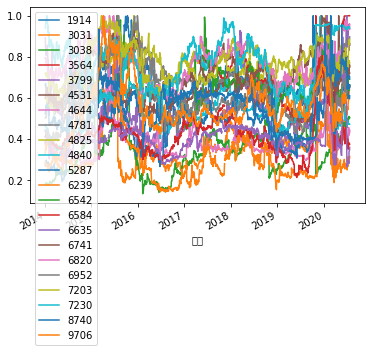

12


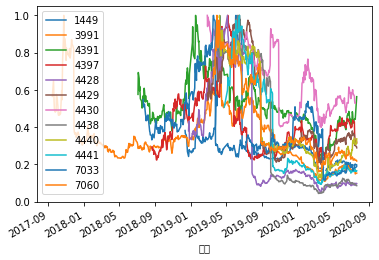

47


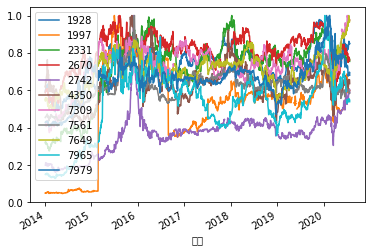

8


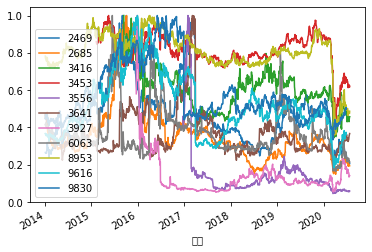

44


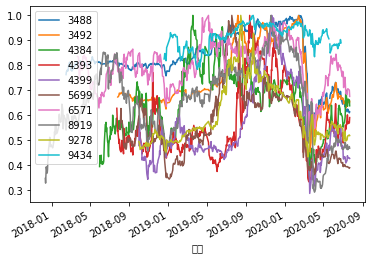

22


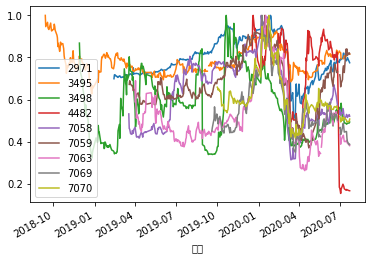

32


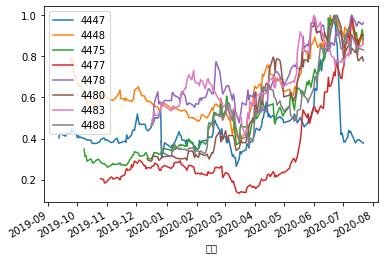

16


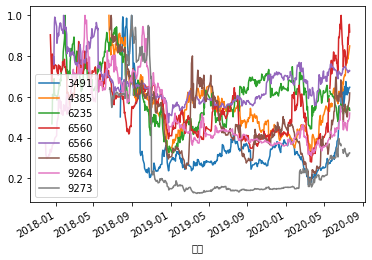

34


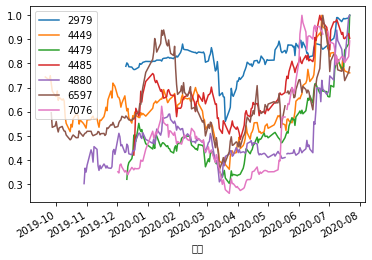

2


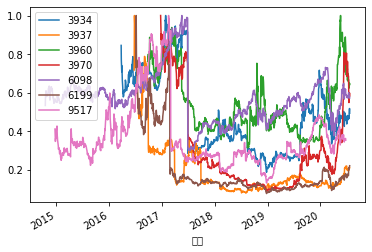

35


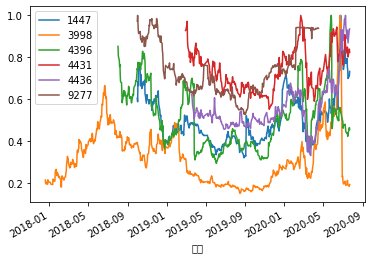

38


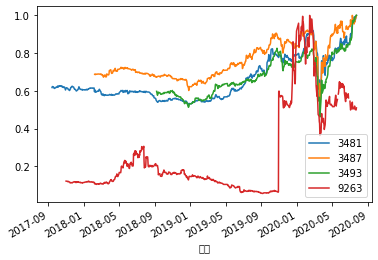

36


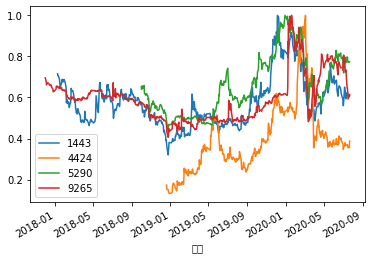

42


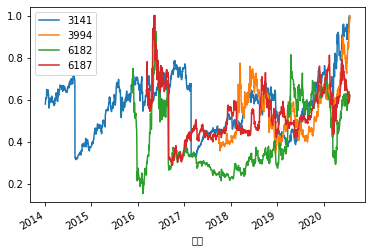

14


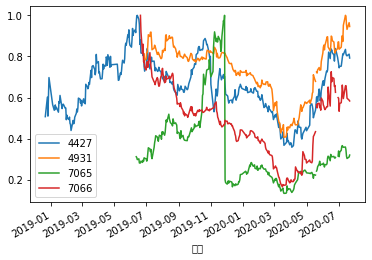

28


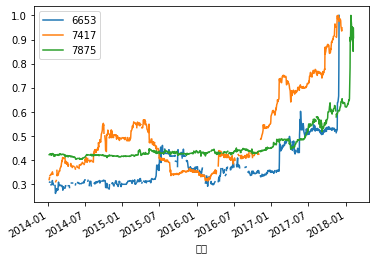

23


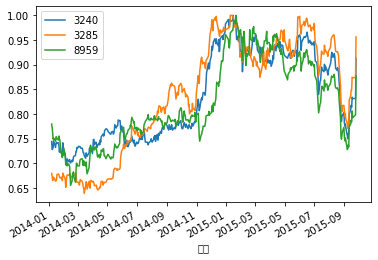

45


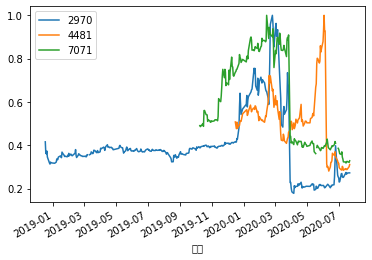

21


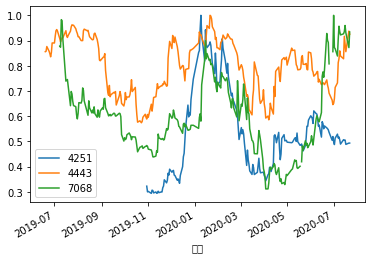

10


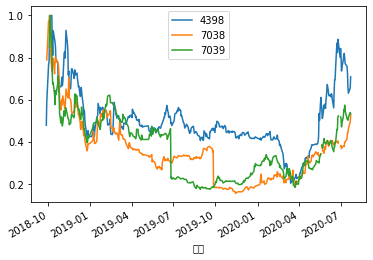

40


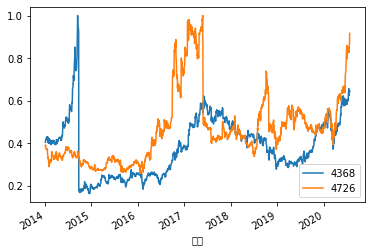

1


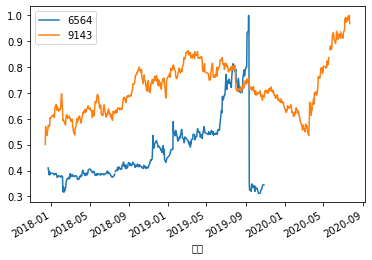

29


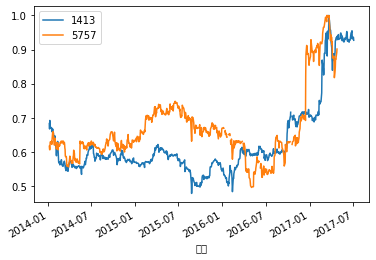

37


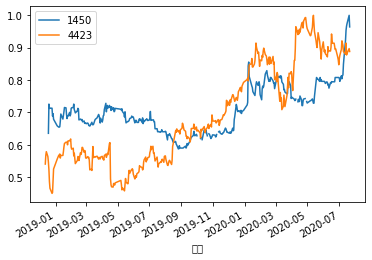

49


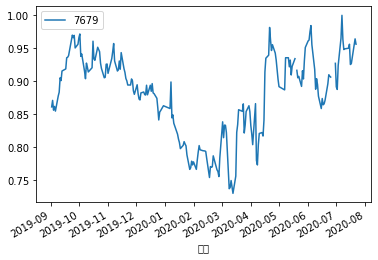

24


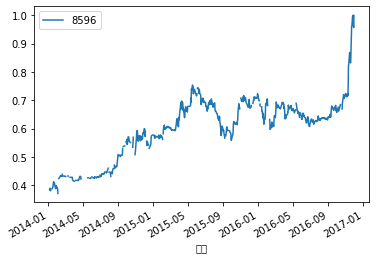

33


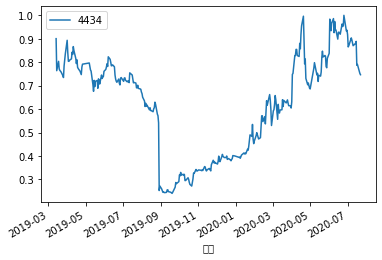

43


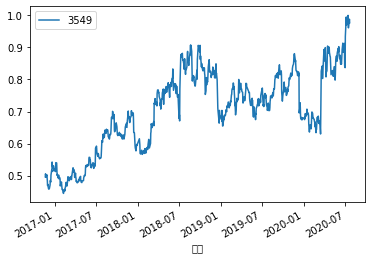

50


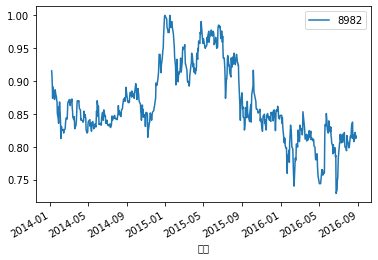

In [153]:

for c in df_cluster['cluster_50_res1'].value_counts().index[13:]:
    print(c)
    codes = df_cluster[(df_cluster['cluster_50_res1'] == c)]['銘柄コード'].tolist()
    (df_merged[codes][df_merged.index > start_dt] / df_merged[codes][df_merged.index > start_dt].max(axis=0)).plot()
    plt.show()

In [156]:
df_merged[df_merged.index > start_dt].transpose()

日付,2014-01-06,2014-01-07,2014-01-08,2014-01-09,2014-01-10,2014-01-14,2014-01-15,2014-01-16,2014-01-17,2014-01-20,2014-01-21,2014-01-22,2014-01-23,2014-01-24,2014-01-27,2014-01-28,2014-01-29,2014-01-30,2014-01-31,2014-02-03,2014-02-04,2014-02-05,2014-02-06,2014-02-07,2014-02-10,2014-02-12,2014-02-13,2014-02-14,2014-02-17,2014-02-18,2014-02-19,2014-02-20,2014-02-21,2014-02-24,2014-02-25,2014-02-26,2014-02-27,2014-02-28,2014-03-03,2014-03-04,...,2020-05-25,2020-05-26,2020-05-27,2020-05-28,2020-05-29,2020-06-01,2020-06-02,2020-06-03,2020-06-04,2020-06-05,2020-06-08,2020-06-09,2020-06-10,2020-06-11,2020-06-12,2020-06-15,2020-06-16,2020-06-17,2020-06-18,2020-06-19,2020-06-22,2020-06-23,2020-06-24,2020-06-25,2020-06-29,2020-06-30,2020-07-01,2020-07-02,2020-07-03,2020-07-06,2020-07-07,2020-07-08,2020-07-09,2020-07-10,2020-07-14,2020-07-15,2020-07-16,2020-07-17,2020-07-21,2020-07-22
1301,271.0,268.0,270.0,268.0,267.0,266.0,268.0,268.0,269.0,270.0,273.0,274.0,271.0,269.0,266.0,266.0,270.0,266.0,267.0,262.0,254.0,254.0,259.0,267.0,269.0,271.0,266.0,263.0,266.0,267.0,267.0,268.0,271.0,273.0,271.0,270.0,269.0,267.0,269.0,269.0,...,2687.0,2690.0,2700.0,2727.0,2695.0,2701.0,2730.0,2750.0,2752.0,2787.0,2775.0,2771.0,2760.0,2704.0,2685.0,2656.0,2709.0,2713.0,2705.0,2680.0,2683.0,2713.0,2670.0,2682.0,2728.0,2720.0,2680.0,2697.0,2731.0,2740.0,2739.0,2733.0,2712.0,2650.0,2735.0,2748.0,2739.0,2756.0,2773.0,2720.0
1332,239.0,235.0,237.0,234.0,236.0,230.0,234.0,231.0,232.0,233.0,233.0,233.0,229.0,224.0,215.0,217.0,224.0,217.0,211.0,211.0,200.0,212.0,212.0,220.0,224.0,226.0,222.0,215.0,220.0,224.0,224.0,224.0,231.0,229.0,230.0,225.0,223.0,226.0,222.0,222.0,...,488.0,499.0,504.0,510.0,499.0,497.0,504.0,505.0,503.0,512.0,517.0,518.0,521.0,492.0,489.0,473.0,503.0,486.0,492.0,492.0,485.0,488.0,479.0,469.0,456.0,468.0,461.0,467.0,463.0,473.0,467.0,467.0,460.0,449.0,463.0,474.0,477.0,471.0,473.0,463.0
1333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2213.0,2279.0,2336.0,2349.0,2331.0,2301.0,2327.0,2333.0,2349.0,2368.0,2401.0,2383.0,2343.0,2264.0,2201.0,2129.0,2215.0,2207.0,2198.0,2250.0,2216.0,2239.0,2213.0,2152.0,2161.0,2207.0,2162.0,2168.0,2132.0,2196.0,2131.0,2138.0,2102.0,2064.0,2130.0,2155.0,2173.0,2158.0,2167.0,2138.0
1352,137.0,137.0,139.0,137.0,134.0,133.0,136.0,137.0,141.0,142.0,144.0,169.0,176.0,181.0,164.0,158.0,160.0,150.0,149.0,140.0,130.0,132.0,134.0,138.0,139.0,139.0,141.0,133.0,134.0,139.0,138.0,137.0,136.0,136.0,136.0,137.0,135.0,132.0,130.0,132.0,...,951.0,943.0,937.0,945.0,921.0,915.0,914.0,889.0,887.0,935.0,938.0,938.0,924.0,935.0,904.0,897.0,891.0,912.0,911.0,901.0,886.0,912.0,NaN,884.0,915.0,920.0,929.0,900.0,899.0,904.0,929.0,895.0,901.0,896.0,908.0,925.0,925.0,920.0,916.0,905.0
1376,866.0,874.0,914.0,918.0,905.0,899.0,910.0,910.0,910.0,914.0,916.0,912.0,910.0,903.0,884.0,897.0,898.0,881.0,885.0,868.0,842.0,845.0,852.0,873.0,876.0,867.0,874.0,869.0,869.0,878.0,879.0,874.0,880.0,888.0,892.0,889.0,888.0,893.0,885.0,890.0,...,1497.0,1500.0,1500.0,1491.0,1426.0,1393.0,1422.0,1431.0,1424.0,1430.0,1423.0,1429.0,1436.0,1422.0,1422.0,1436.0,1456.0,1467.0,1473.0,1500.0,1497.0,1504.0,1459.0,1464.0,1428.0,1432.0,1486.0,1478.0,1496.0,1490.0,1477.0,1440.0,1410.0,1311.0,1320.0,1466.0,1443.0,1433.0,1460.0,1413.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,1529.0,1528.0,1540.0,1549.0,1547.0,1548.0,1562.0,1560.0,1566.0,1574.0,1572.0,1577.0,1573.0,1560.0,1549.0,1528.0,1547.0,1527.0,1525.0,1525.0,1500.0,1502.0,1502.0,1524.0,1533.0,1540.0,1543.0,1542.0,1543.0,1551.0,1552.0,1555.0,1580.0,1573.0,1585.0,1540.0,1525.0,1518.0,1514.0,1535.0,...,1714.0,1720.0

In [168]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler

In [175]:
dbscan = DBSCAN().fit(MinMaxScaler().fit_transform(df_merged[df_merged.index > start_dt].fillna(0).transpose()))

In [176]:
pd.DataFrame(dbscan.labels_).value_counts()

 0    3771
-1      85
dtype: int64